# Generative Adversarial Networks


### Warum Datenspeicherung in der Cloud?

- lokale Instanzen verfügen über wenig Speicher um große Datensätze + Models zu speichern
- für größere Trainingsvorhaben wird meist auf einer Cloud Platform trainiert
- Bei Verwendung von Google Cloud Storage können wir auf einer TPU trainieren!

## Preparation

In [0]:
# TensorFlow ≥2.1 is required
import os
import tensorflow as tf
from tensorflow import keras
assert tf.__version__ >= "2.1"

import pprint
pprint.pprint(tf.config.list_physical_devices())

[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'),
 PhysicalDevice(name='/physical_device:XLA_CPU:0', device_type='XLA_CPU'),
 PhysicalDevice(name='/physical_device:XLA_GPU:0', device_type='XLA_GPU'),
 PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [0]:
import json
import os
import pprint
import re
import time
import tensorflow as tf

# Google Cloud Storage bucket for Estimator logs and storing
# the training dataset.
bucket = 'intoai-exkurs-gan' #@param {type:"string"}

assert bucket, 'Must specify an existing GCS bucket name'
print('Using bucket: {}'.format(bucket))

model_dir = 'gs://{}/{}'.format(
    bucket, time.strftime('tpuestimator-tfgan/%Y-%m-%d-%H-%M-%S'))
print('Using model dir: {}'.format(model_dir))

from google.colab import auth
auth.authenticate_user()
  
with open('/content/adc.json', 'r') as f:
  auth_info = json.load(f)

!gcloud auth login georglange4@gmail.com

Using bucket: intoai-exkurs-gan
Using model dir: gs://intoai-exkurs-gan/tpuestimator-tfgan/2020-04-17-05-33-34

You are now logged in as [georglange4@gmail.com].
Your current project is [None].  You can change this setting by running:
  $ gcloud config set project PROJECT_ID


In [0]:
import tensorflow as tf
import tensorflow_datasets as tfds

dataset_dir = 'gs://{}/{}'.format(bucket, 'datasets')

def input_fn(mode, batch_size):
  split = 'train' if mode == tf.estimator.ModeKeys.TRAIN else 'test'
  shuffle = (mode == tf.estimator.ModeKeys.TRAIN)

  def _preprocess(element):
    # Map [0, 255] to [-1, 1].
    images = (tf.cast(element['image'], tf.float32) - 127.5) / 127.5
    return images

  # saves images in dataset_dir which is the GCS Storage Bucket
  images_ds = (tfds.load('cifar10', split=split, data_dir=dataset_dir)
               .map(_preprocess, num_parallel_calls=4)
               .cache())
  if shuffle:
    images_ds = images_ds.shuffle(
        buffer_size=10000, reshuffle_each_iteration=True)
  images_ds = (images_ds.batch(batch_size, drop_remainder=True)
               .prefetch(tf.data.experimental.AUTOTUNE))
  
  return images_ds

In [0]:
batch_size = 128 #@param
train_data = input_fn(tf.estimator.ModeKeys.TRAIN, batch_size)

     |████████████████████████████████| 399kB 4.7MB/s 
  Created wheel for deeplearning2020: filename=deeplearning2020-0.4.21-py2.py3-none-any.whl size=8548 sha256=e64eaf76de09ae381beb515f1c9638da67397fb1670c8c36532228b7ae518dca
  Stored in directory: /root/.cache/pip/wheels/7f/c2/8a/f9f03fc839999f1fe9d5e5a9d2c97cdd5cb8329f61f82ea2c9
  Created wheel for kerasltisubmission: filename=kerasltisubmission-0.4.9-py2.py3-none-any.whl size=8867 sha256=46a29f9d45a4083304d7fd5b57196766cb668fe0e02ef0eb002e352352aa49d7
  Stored in directory: /root/.cache/pip/wheels/fd/61/f7/09171376b25408ae21b58e98c9fbf2eb924f676bb77659f983
Successfully built deeplearning2020 kerasltisubmission
     |████████████████████████████████| 368kB 3.4MB/s 



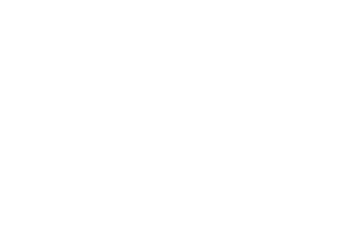

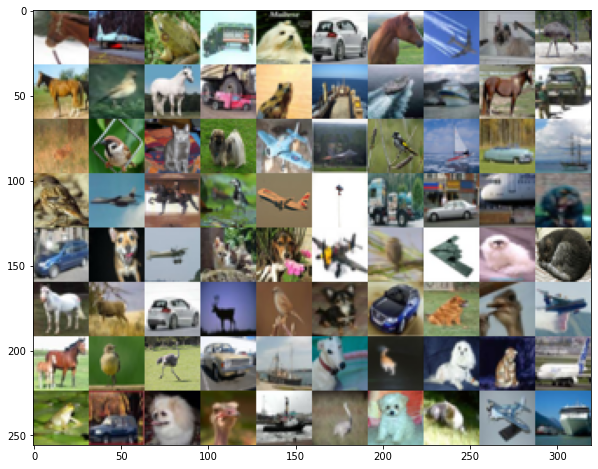

In [0]:
!pip install deeplearning2020
!pip install tensorflow_gan

from deeplearning2020 import helpers
import tensorflow_gan as tfgan
import matplotlib.pyplot as plt
import numpy as np

%matplotlib inline

class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

def show_image_grid_from_dataset(dataset):
  numpy_imgs = np.asarray(list(dataset.take(80).as_numpy_iterator())).reshape(80, 32, 32, 3)
  image_grid = tfgan.eval.python_image_grid(numpy_imgs, grid_shape=(8, 10))
  plt.axis('off')
  plt.figure(figsize=(10,8))
  plt.imshow((image_grid + 1.0) / 2.0,  # [-1, 1] -> [0, 1]
             aspect='auto')
  plt.show()

def show_image_grid(numpy_imgs):
  # assert len(numpy_imgs) < 16, 'You should provide 16 images.'
  image_grid = tfgan.eval.python_image_grid(numpy_imgs[:16], grid_shape=(4, 4))
  plt.axis('off')
  plt.figure(figsize=(5,5))
  plt.imshow((image_grid + 1.0) / 2.0,  # map images because matplotlib needs [0, 1]: [-1, 1] -> [0, 1]
             aspect='auto')
  plt.show()

show_image_grid_from_dataset(input_fn(tf.estimator.ModeKeys.EVAL, 1))

## Train Algorithm

In [0]:
def train_gan(gan, dataset, batch_size, codings_size, n_epochs=50):
    generator, discriminator = gan.layers
    for epoch in range(n_epochs):
        print("Epoch {}/{}".format(epoch + 1, n_epochs))
        for X_batch in dataset:
            # phase 1 - training the discriminator
            noise = tf.random.normal(shape=[batch_size // 2, codings_size])
            generated_images = generator(noise)
            X_fake_and_real = tf.concat([generated_images, X_batch[:(batch_size // 2)]], axis=0)
            y1 = tf.constant([[0.]] * (batch_size // 2) + [[1.]] * (batch_size // 2))
            discriminator.train_on_batch(X_fake_and_real, y1)

            # phase 2 - training the generator
            noise = tf.random.normal(shape=[batch_size, codings_size])
            y2 = tf.constant([[1.]] * batch_size)
            gan.train_on_batch(noise, y2)
        show_image_grid(generated_images)                    
        plt.show()   

In [0]:
import time
from tqdm import tqdm, trange

training_set_size = 50000 // batch_size # count of batches of Cifar10

def train_gan(gan, dataset, batch_size, codings_size, n_epochs=50, verbose=True):
    generator, discriminator = gan.layers
    for epoch in range(n_epochs):
        print("Epoch {}/{}".format(epoch + 1, n_epochs))
        with tqdm(total=training_set_size) as progress:
            for X_batch in dataset:
                # phase 1 - training the discriminator
                # d_batch_size = batch_size // 2
                d_batch_size = batch_size
                noise = tf.random.normal(shape=[d_batch_size, codings_size])
                generated_images = generator(noise)
                X_fake_and_real = tf.concat([generated_images, X_batch[:(d_batch_size)]], axis=0)
                y1 = tf.constant([[0.]] * (d_batch_size))
                y2 = tf.constant([[1.]] * (d_batch_size))
                # discriminator.train_on_batch(X_fake_and_real, y1)
                discriminator.train_on_batch(generated_images, y1)
                discriminator.train_on_batch(X_batch, y2)

                # phase 2 - training the generator
                noise = tf.random.normal(shape=[batch_size, codings_size])
                y2 = tf.constant([[1.]] * batch_size)
                gan.train_on_batch(noise, y2)

                if verbose:
                  progress.set_description(f"Epoch {epoch+1}")
                  progress.update(1)
            show_image_grid(generated_images)
            plt.show()  

## Generator

In [0]:
from tensorflow.keras.layers import *
codings_size = 100

start_height = 4
start_width = 4

input_layer = Input(shape=(codings_size))
random_vector = Dense(start_width * start_height * 256)(input_layer)
model = Reshape([start_height, start_width, 256])(random_vector)
model = Conv2DTranspose(128, kernel_size=5, strides=2, padding='same', activation='selu')(model)
model = BatchNormalization(axis=[1, 2])(model)
model = Conv2DTranspose(64, kernel_size=5, strides=2, padding='same', activation='selu')(model)
model = BatchNormalization(axis=[1, 2])(model)
model = Conv2DTranspose(3, kernel_size=5, strides=2, padding='same', activation='tanh')(model)
generator = tf.keras.Model(input_layer, model)

In [0]:
generator.summary()

Model: "model_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_25 (InputLayer)        [(None, 100)]             0         
_________________________________________________________________
dense_10 (Dense)             (None, 4096)              413696    
_________________________________________________________________
reshape_4 (Reshape)          (None, 4, 4, 256)         0         
_________________________________________________________________
conv2d_transpose_20 (Conv2DT (None, 8, 8, 128)         819328    
_________________________________________________________________
batch_normalization_108 (Bat (None, 8, 8, 128)         256       
_________________________________________________________________
conv2d_transpose_21 (Conv2DT (None, 16, 16, 64)        204864    
_________________________________________________________________
batch_normalization_109 (Bat (None, 16, 16, 64)        102

## Discriminator

In [0]:
input_layer = Input(shape=(32, 32, 3))
model = Conv2D(64, kernel_size=5, strides=2, padding='same', 
               activation=LeakyReLU(0.2))(input_layer)
model = BatchNormalization(axis=[1,2])(model)

model = Conv2D(128, kernel_size=5, strides=2, padding='same', 
               activation=LeakyReLU(0.2))(model)
model = BatchNormalization(axis=[1,2])(model)

model = Conv2D(256, kernel_size=5, strides=2, padding='same', 
               activation=LeakyReLU(0.2))(model)
model = BatchNormalization(axis=[1,2])(model)

model = Flatten()(model)

model = Dense(1, activation='sigmoid')(model)

discriminator = tf.keras.Model(input_layer, model)

In [0]:
discriminator.summary()

Model: "model_13"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_28 (InputLayer)        [(None, 32, 32, 3)]       0         
_________________________________________________________________
conv2d_106 (Conv2D)          (None, 16, 16, 64)        4864      
_________________________________________________________________
batch_normalization_118 (Bat (None, 16, 16, 64)        1024      
_________________________________________________________________
conv2d_107 (Conv2D)          (None, 8, 8, 128)         204928    
_________________________________________________________________
batch_normalization_119 (Bat (None, 8, 8, 128)         256       
_________________________________________________________________
conv2d_108 (Conv2D)          (None, 4, 4, 256)         819456    
_________________________________________________________________
batch_normalization_120 (Bat (None, 4, 4, 256)         64 

## Training

In [0]:
gan = tf.keras.Sequential([generator, discriminator])

In [0]:
discriminator.compile(loss='binary_crossentropy', optimizer='rmsprop')
discriminator.trainable = False
gan.compile(loss='binary_crossentropy', optimizer='rmsprop')

  0%|          | 0/321 [00:00<?, ?it/s]

Epoch 1/3


Epoch 1:  97%|█████████▋| 312/321 [01:25<00:02,  3.82it/s]

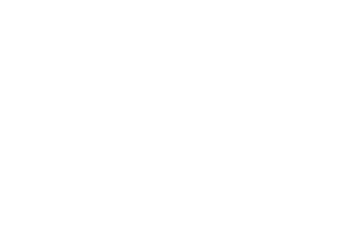

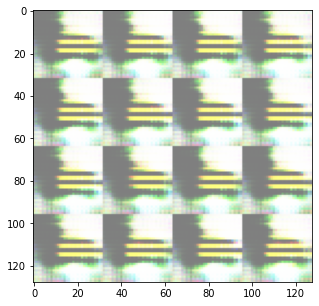

  0%|          | 0/321 [00:00<?, ?it/s]

Epoch 2/3


Epoch 2:  97%|█████████▋| 312/321 [01:25<00:02,  3.69it/s]

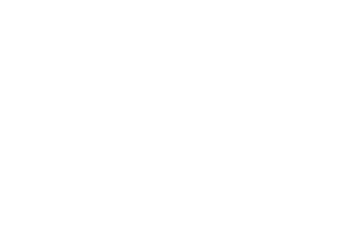

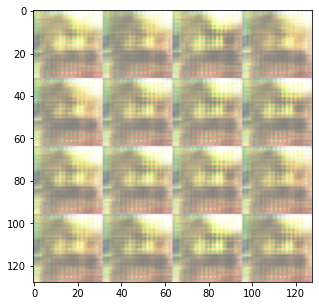

  0%|          | 0/321 [00:00<?, ?it/s]

Epoch 3/3


Epoch 3:  97%|█████████▋| 312/321 [01:25<00:02,  3.65it/s]

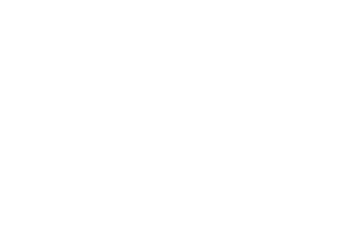

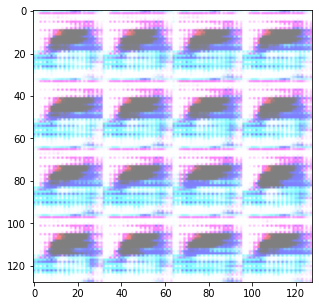

Epoch 3:  97%|█████████▋| 312/321 [01:25<00:02,  3.63it/s]


In [0]:
train_gan(gan, train_data, 32, codings_size=codings_size, n_epochs=3)

## Minibatch Standard Deviation Layer

In [0]:
# HINT: You have to train the discriminator with batches of fake and real data
# indepentently. This means you must not concatenate real and fake images into one batch
# Instead train two times with images in seperate batches

class MinibatchStdLayer(tf.keras.layers.Layer):

  def __init__(self, **kwargs):
    super(MinibatchStdLayer, self).__init__(*kwargs)
    self.input_dims = None

  def build(self, input_shape):
    super(MinibatchStdLayer, self).build(input_shape)
    self.input_dims = input_shape

  def call(self, layer):
      S = tf.math.reduce_std(layer, axis=[0, -1])
      v = tf.reduce_mean(S)
      return tf.concat([layer, tf.fill([batch_size, self.input_dims[1], self.input_dims[2], 1], v)], axis=-1)

  def compute_output_shape(self, input_shape):
    return [input_shape[0], input_shape[1], input_shape[2], input_shape[3] + 1]

## Plain DCGAN

### Generator

In [0]:
from tensorflow.keras.layers import *

init = tf.keras.initializers.TruncatedNormal(stddev=0.02)
codings_size = 100

start_height = 4
start_width = 4

input_layer = Input(shape=(codings_size))
random_vector = Dense(start_width * start_height * 256, kernel_initializer=init)(input_layer)
model = Reshape([start_height, start_width, 256])(random_vector)

model = Conv2DTranspose(128, kernel_size=5, kernel_initializer=init, strides=2, padding='same')(model)
model = BatchNormalization(axis=[1, 2])(model)
model = tf.keras.layers.ReLU()(model)

model = Conv2DTranspose(64, kernel_size=4, strides=2, kernel_initializer=init, padding='same')(model)
model = BatchNormalization(axis=[1, 2])(model)
model = tf.keras.layers.ReLU()(model)

model = Conv2DTranspose(3, kernel_size=4, strides=2, kernel_initializer=init, padding='same', activation='tanh')(model)
generator = tf.keras.Model(input_layer, model)
generator.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_11 (InputLayer)        [(None, 100)]             0         
_________________________________________________________________
dense_2 (Dense)              (None, 4096)              413696    
_________________________________________________________________
reshape_1 (Reshape)          (None, 4, 4, 256)         0         
_________________________________________________________________
conv2d_transpose_3 (Conv2DTr (None, 8, 8, 128)         819328    
_________________________________________________________________
batch_normalization_756 (Bat (None, 8, 8, 128)         256       
_________________________________________________________________
re_lu_2 (ReLU)               (None, 8, 8, 128)         0         
_________________________________________________________________
conv2d_transpose_4 (Conv2DTr (None, 16, 16, 64)        1311

### Discriminator

In [0]:
input_layer = Input(shape=(32, 32, 3))
model = Conv2D(64, kernel_size=5, strides=2, kernel_initializer=init, padding='same', 
               activation=LeakyReLU(0.2))(input_layer)

model = Conv2D(128, kernel_size=5, strides=2, kernel_initializer=init, padding='same')(model)
model = BatchNormalization(axis=[1,2])(model)
model = tf.keras.layers.LeakyReLU(0.2)(model)

model = Conv2D(256, kernel_size=5, strides=2, kernel_initializer=init, padding='same')(model)
model = BatchNormalization(axis=[1,2])(model)
model = tf.keras.layers.LeakyReLU(0.2)(model)

model = Flatten()(model)

model = Dense(1, kernel_initializer=init, activation='sigmoid')(model)

discriminator = tf.keras.Model(input_layer, model)
discriminator.summary()

Model: "model_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_12 (InputLayer)        [(None, 32, 32, 3)]       0         
_________________________________________________________________
conv2d_755 (Conv2D)          (None, 16, 16, 64)        4864      
_________________________________________________________________
conv2d_756 (Conv2D)          (None, 8, 8, 128)         204928    
_________________________________________________________________
batch_normalization_758 (Bat (None, 8, 8, 128)         256       
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (None, 8, 8, 128)         0         
_________________________________________________________________
conv2d_757 (Conv2D)          (None, 4, 4, 256)         819456    
_________________________________________________________________
batch_normalization_759 (Bat (None, 4, 4, 256)         64  

### Training

In [0]:
from tensorflow.keras.optimizers import Adam

generator_lr = 0.0001  #@param
discriminator_lr = 0.0002  #@param
epochs = 2000 #@param
n_iter_per_epoch = 1 #@param

optimizer_generator = Adam(generator_lr, 0.5)
optimizer_discriminator = Adam(discriminator_lr, 0.5)

gan = tf.keras.Sequential([generator, discriminator])
discriminator.compile(loss='binary_crossentropy', optimizer=optimizer_discriminator)
discriminator.trainable = False
gan.compile(loss='binary_crossentropy', optimizer=optimizer_generator)

train_gan(gan, train_data.repeat(n_iter_per_epoch), batch_size, codings_size=codings_size, n_epochs=epochs)

## Inception Score

In [0]:
# see also: https://machinelearningmastery.com/how-to-implement-the-inception-score-from-scratch-for-evaluating-generated-images/

from numpy import expand_dims
from numpy import log
from numpy import mean
from numpy import std
from numpy import exp
from tensorflow.keras.applications.inception_v3 import InceptionV3

# assumes pixels in [-1,1]
# warning: func could crash in case of many images
def inception_score(images, eps=1E-16):
	# load inception v3 model
  model = InceptionV3()
	# predict class probabilities for images
  # P(y|x) are the predictions for each image
  p_yx = model.predict(images.map(lambda x: tf.image.resize(x, (299, 299))))

  # calculate p(y), this is the mean of the predictions for all images
  p_y = expand_dims(p_yx.mean(axis=0), 0)
  # calculate KL divergence using log probabilities
  kl_d = p_yx * (log(p_yx + eps) - log(p_y + eps))
  # sum over classes
  sum_kl_d = kl_d.sum(axis=1)
  # average over images
  avg_kl_d = mean(sum_kl_d)
  # undo the log
  is_score = exp(avg_kl_d)
  return is_score

In [0]:
# higher score is better
# GAN produces probably good images if inception score of train data is similar 
# to the inception score of the generated images
inception_score(train_data)

96116736/96112376 [==============================] - 1s 0us/step


10.851029

In [0]:
# takes a given GAN, generates images and calculates inception score
def calculate_inception_score(gan, n_samples=1000):
  # generate images with the generator
  n_codings = gan.inputs[0].shape[1]
  noise = tf.random.normal((n_samples, n_codings))
  generator = gan.layers[0]
  images = generator(noise)
  # the inception score func wants an image dataset as input
  image_ds = tf.data.Dataset.from_tensor_slices(images).batch(n_samples)
  return inception_score(image_ds)

In [0]:
# calculate the inception distance for the last trained GAN
calculate_inception_score(gan)

## Frechet Inception Distance

In [0]:
import scipy
from tensorflow.keras.applications.inception_v3 import InceptionV3


def frechet_inception_distance(train_data, gan, n_samples=10000):
  # image size for Inception is 75x75 as a minimum. 96x96 is the first bigger multiple of 32x32
  # so 96x96 is the least computational intensive input size
  width = 96
  inception = InceptionV3(include_top=False, pooling='avg', input_shape=(width, width, 3))

  # get and resize real images
  images_real = train_data.unbatch().take(n_samples).map(lambda x: tf.image.resize(x, (width, width))).batch(n_samples)

  # generate fake images
  n_codings = gan.inputs[0].shape[1]
  noise = tf.random.normal((n_samples, n_codings))
  generator = gan.layers[0]
  images_fake = generator(noise)
  images_fake = tf.data.Dataset.from_tensor_slices(images_fake).map(lambda x: tf.image.resize(x, (width, width))).batch(n_samples)

  # uncomment if you want to calculate fid just between the train data itself
  # images_fake = train_data.unbatch().take(n_samples).map(lambda x: tf.image.resize(x, (width, width))).batch(n_samples)

	# calculate activations
  activations_real = inception.predict(images_real)
  activations_fake = inception.predict(images_fake)

  # calculate mean and covariance statistics
  mu1, sigma1 = activations_real.mean(axis=0), np.cov(activations_real, rowvar=False)
  mu2, sigma2 = activations_fake.mean(axis=0), np.cov(activations_fake, rowvar=False)
  # calculate sum squared difference between means
  ssdiff = np.sum((mu1 - mu2)**2.0)
  # calculate sqrt of product between cov
  covmean = scipy.linalg.sqrtm(sigma1.dot(sigma2))
  # check and correct imaginary numbers from sqrt
  if np.iscomplexobj(covmean):
    covmean = covmean.real
  # calculate score
  fid = ssdiff + np.trace(sigma1 + sigma2 - 2.0 * covmean)
  return fid

In [0]:
# fid between the train data itself
frechet_inception_distance(train_data, gan)

21.215281573755234

In [0]:
# fid between the fake and real images
frechet_inception_distance(train_data, gan)

331.9645219377865

## Implement metrics to the training loop and integrate Tensorboard

In [0]:
import datetime
# Load the TensorBoard notebook extension
%load_ext tensorboard
# Clear any logs from previous runs
!rm -rf ./logs/ 

In [0]:
current_time = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
class Metrics:

  # In Colab, you may mount your Google Drive and save the metrics and models in Drive
  def __init__(self, train_log_dir='logs/' + current_time + '/train'):
    self.step = 0
    self.epoch = 0
    self.train_summary_writer = tf.summary.create_file_writer(train_log_dir)

    self.epoch_discriminator_losses = list()
    self.epoch_generator_losses = list()
    self.epoch_accuracies = list()

  def save_losses(self, discriminator_loss, generator_loss, accuracy):
    self.epoch_discriminator_losses.append(discriminator_loss)
    self.epoch_generator_losses.append(generator_loss)
    self.epoch_accuracies.append(accuracy)

    with self.train_summary_writer.as_default():
      tf.summary.scalar('discriminator_loss', discriminator_loss, self.step)
      tf.summary.scalar('generator_loss', generator_loss, self.step)
      tf.summary.scalar('accuracy', accuracy, self.step)

    self.step += 1

  def on_epoch_end(self, train_data, gan, n_eval):
    # calculate all metrices
    inception_score = calculate_inception_score(gan, n_eval)
    print('Inception Score (IS): ', inception_score)
    fid = frechet_inception_distance(train_data, gan, n_eval)
    print('Frechet Inception Distance (FID): ', fid)
    mean_discriminator_loss = np.mean(self.epoch_discriminator_losses)
    print('Discriminator loss: ', mean_discriminator_loss)
    mean_generator_loss = np.mean(self.epoch_generator_losses)
    print('Generator loss: ', mean_generator_loss)
    mean_accuracy = np.mean(self.epoch_accuracies)
    print('Discriminator Accuracy: ', mean_accuracy)

    # save metrices for Tensorboard
    with self.train_summary_writer.as_default():
      tf.summary.scalar('inception_score', inception_score, self.epoch)
      tf.summary.scalar('frechet_inception_distance', fid, self.epoch)
      tf.summary.scalar('mean_accuracy', mean_accuracy, self.epoch)
      tf.summary.scalar('mean_discriminator_loss', mean_discriminator_loss, self.epoch)
      tf.summary.scalar('mean_generator_loss', mean_generator_loss, self.epoch)

    # clear epoch metrics
    self.epoch_discriminator_losses = list()
    self.epoch_generator_losses = list()
    self.epoch_accuracies = list()
    self.epoch += 1


  

In [0]:
import time
from tqdm import tqdm, trange

training_set_size = 50000 // batch_size # count of batches of Cifar10
# You may want to save to Drive or the Google Storage Bucket
model_file = 'GAN-001.h5'

# Integrate Metrics into the training loop
def train_gan(gan, dataset, batch_size, codings_size, n_epochs=50, verbose=True, n_eval=1000):
    generator, discriminator = gan.layers
    metrics = Metrics()
    step = 0
    for epoch in range(n_epochs):
        print("Epoch {}/{}".format(epoch + 1, n_epochs))
        with tqdm(total=training_set_size) as progress:
            for X_batch in dataset:
                # phase 1 - training the discriminator
                noise = tf.random.normal(shape=[batch_size // 2, codings_size])
                generated_images = generator(noise)
                X_fake_and_real = tf.concat([generated_images, X_batch[:(batch_size // 2)]], axis=0)
                y1 = tf.constant([[0.]] * (batch_size // 2) + [[1.]] * (batch_size // 2))
                discriminator.trainable = True
                discriminator_loss, accuracy = discriminator.train_on_batch(X_fake_and_real, y1)


                # phase 2 - training the generator
                noise = tf.random.normal(shape=[batch_size, codings_size])
                y2 = tf.constant([[1.]] * batch_size)
                discriminator.trainable = False
                generator_loss = gan.train_on_batch(noise, y2)
                metrics.save_losses(discriminator_loss, generator_loss, accuracy)

                if verbose:
                  progress.set_description(f"Epoch {epoch+1}, Generator Loss: {generator_loss}, Discriminator Loss: {discriminator_loss}, {accuracy}")
                  progress.update(1)

                # Calculate and save metrics after each epoch. Specify if you want to calculate metrics more or less often
                if step % training_set_size == 0:
                  metrics.on_epoch_end(train_data, gan, n_eval)
                  gan.save(model_file)
                step += 1
            show_image_grid(generated_images[:16])
            plt.show()   

## Example of Mode Collapse

In [0]:
from tensorflow.keras.layers import *

# GENERATOR

init = tf.keras.initializers.TruncatedNormal(stddev=0.02)
codings_size = 100

start_height = 4
start_width = 4

input_layer = Input(shape=(codings_size))
random_vector = Dense(start_width * start_height * 256, kernel_initializer=init)(input_layer)
model = Reshape([start_height, start_width, 256])(random_vector)
model = BatchNormalization(axis=-1)(model)
model = Conv2DTranspose(128, kernel_size=5, kernel_initializer=init, strides=2, padding='same')(model)
model = BatchNormalization(axis=-1)(model)
model = tf.keras.layers.ReLU()(model)

model = Conv2DTranspose(64, kernel_size=4, strides=2, kernel_initializer=init, padding='same')(model)
model = BatchNormalization(axis=-1)(model)
model = tf.keras.layers.ReLU()(model)

model = Conv2DTranspose(3, kernel_size=4, strides=2, kernel_initializer=init, padding='same', activation='tanh')(model)
generator = tf.keras.Model(input_layer, model)
generator.summary()


# DISCRIMINATOR
input_layer = Input(shape=(32, 32, 3))
model = Conv2D(64, kernel_size=5, strides=2, kernel_initializer=init, padding='same', 
               activation=LeakyReLU(0.2))(input_layer)
model = Conv2D(128, kernel_size=5, strides=2, kernel_initializer=init, padding='same')(model)
model = BatchNormalization(axis=-1)(model)
model = tf.keras.layers.LeakyReLU(0.2)(model)
model = Conv2D(256, kernel_size=5, strides=2, kernel_initializer=init, padding='same')(model)
model = BatchNormalization(axis=-1)(model)
model = tf.keras.layers.LeakyReLU(0.2)(model)

model = MinibatchStdLayer()(model)
model = Flatten()(model)

model = Dense(1, kernel_initializer=init, activation='sigmoid')(model)

discriminator = tf.keras.Model(input_layer, model)
discriminator.summary()

Model: "model_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_19 (InputLayer)        [(None, 100)]             0         
_________________________________________________________________
dense_7 (Dense)              (None, 4096)              413696    
_________________________________________________________________
reshape_4 (Reshape)          (None, 4, 4, 256)         0         
_________________________________________________________________
batch_normalization_898 (Bat (None, 4, 4, 256)         1024      
_________________________________________________________________
conv2d_transpose_12 (Conv2DT (None, 8, 8, 128)         819328    
_________________________________________________________________
batch_normalization_899 (Bat (None, 8, 8, 128)         512       
_________________________________________________________________
re_lu_8 (ReLU)               (None, 8, 8, 128)         0   

In [0]:
import tensorflow_gan as tfgan

# You see heavy mode collapse and convergence failure

generator_lr = 0.0002  #@param
discriminator_lr = 0.0002  #@param
epochs = 2000 #@param
n_iter_per_epoch = 1 #@param

gan = tf.keras.Sequential([generator, discriminator])
discriminator.compile(loss='binary_crossentropy', optimizer=tf.keras.optimizers.Adam(discriminator_lr, 0.5), metrics='accuracy')
discriminator.trainable = False
gan.compile(loss='binary_crossentropy', optimizer=tf.keras.optimizers.Adam(generator_lr, 0.5))

train_gan(gan, train_data.repeat(n_iter_per_epoch), batch_size, codings_size=codings_size, n_epochs=epochs)

### Tensorboard: Signs of Mode Collapse and Convergence Failure

- discriminator loss is near 0
- accuracy is near 100% (means discriminator does perfekt predictions)
- generator loss oszillates heavy

In [0]:
# Specify the directory where the logs are saved
%tensorboard --logdir 'logs/'

## Next Model

In [0]:
from tensorflow.keras.layers import *

# GENERATOR

init = tf.keras.initializers.TruncatedNormal(stddev=0.02)
codings_size = 100

start_height = 4
start_width = 4

input_layer = Input(shape=(codings_size))
random_vector = Dense(start_width * start_height * 256, kernel_initializer=init)(input_layer)
model = Reshape([start_height, start_width, 256])(random_vector)

model = Conv2DTranspose(128, kernel_size=5, kernel_initializer=init, strides=2, padding='same')(model)
model = BatchNormalization(axis=[1, 2])(model)
model = tf.keras.layers.ReLU()(model)

model = Conv2DTranspose(64, kernel_size=4, strides=2, kernel_initializer=init, padding='same')(model)
model = BatchNormalization(axis=[1, 2])(model)
model = tf.keras.layers.ReLU()(model)

model = Conv2DTranspose(3, kernel_size=4, strides=2, kernel_initializer=init, padding='same', activation='tanh')(model)
generator = tf.keras.Model(input_layer, model)
generator.summary()


# DISCRIMINATOR
input_layer = Input(shape=(32, 32, 3))
model = Conv2D(64, kernel_size=5, strides=2, kernel_initializer=init, padding='same', 
               activation=LeakyReLU(0.2))(input_layer)

model = Conv2D(128, kernel_size=5, strides=2, kernel_initializer=init, padding='same')(model)
model = BatchNormalization(axis=[1,2])(model)
model = tf.keras.layers.LeakyReLU(0.2)(model)

model = Conv2D(256, kernel_size=5, strides=2, kernel_initializer=init, padding='same')(model)
model = BatchNormalization(axis=[1,2])(model)
model = tf.keras.layers.LeakyReLU(0.2)(model)

model = MinibatchStdLayer()(model)
model = Flatten()(model)

model = Dense(1, kernel_initializer=init, activation='sigmoid')(model)

discriminator = tf.keras.Model(input_layer, model)
discriminator.summary()

Model: "model_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_39 (InputLayer)        [(None, 100)]             0         
_________________________________________________________________
dense_7 (Dense)              (None, 4096)              413696    
_________________________________________________________________
reshape_4 (Reshape)          (None, 4, 4, 256)         0         
_________________________________________________________________
conv2d_transpose_12 (Conv2DT (None, 8, 8, 128)         819328    
_________________________________________________________________
batch_normalization_2836 (Ba (None, 8, 8, 128)         256       
_________________________________________________________________
re_lu_8 (ReLU)               (None, 8, 8, 128)         0         
_________________________________________________________________
conv2d_transpose_13 (Conv2DT (None, 16, 16, 64)        1311

In [0]:
import tensorflow_gan as tfgan


noise_dims = 1024 #@param
generator_lr = 0.0001  #@param
discriminator_lr = 0.0002  #@param
epochs = 2000 #@param
n_iter_per_epoch = 1 #@param

gan = tf.keras.Sequential([generator, discriminator])
discriminator.compile(loss='binary_crossentropy', optimizer=tf.keras.optimizers.Adam(discriminator_lr, 0.5), metrics='accuracy')
discriminator.trainable = False
gan.compile(loss='binary_crossentropy', optimizer=tf.keras.optimizers.Adam(generator_lr, 0.5))

train_gan(gan, train_data.repeat(n_iter_per_epoch), batch_size, codings_size=codings_size, n_epochs=epochs)

In [0]:
%tensorboard --logdir logs/fit

## Wasserstein GAN

### Generator

In [0]:
from tensorflow.keras.layers import *
# GENERATOR

init = tf.keras.initializers.TruncatedNormal(stddev=0.02)
codings_size = 100

start_height = 4
start_width = 4

input_layer = Input(shape=(codings_size))
random_vector = Dense(start_width * start_height * 256, kernel_initializer=init)(input_layer)
model = Reshape([start_height, start_width, 256])(random_vector)

model = Conv2DTranspose(128, kernel_size=5, kernel_initializer=init, strides=2, padding='same')(model)
model = BatchNormalization(axis=[1, 2])(model)
model = tf.keras.layers.ReLU()(model)

model = Conv2DTranspose(64, kernel_size=4, strides=2, kernel_initializer=init, padding='same')(model)
model = BatchNormalization(axis=[1, 2])(model)
model = tf.keras.layers.ReLU()(model)

model = Conv2DTranspose(3, kernel_size=4, strides=2, kernel_initializer=init, padding='same', activation='tanh')(model)
generator = tf.keras.Model(input_layer, model)
generator.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 100)]             0         
_________________________________________________________________
dense (Dense)                (None, 4096)              413696    
_________________________________________________________________
reshape (Reshape)            (None, 4, 4, 256)         0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 8, 8, 128)         819328    
_________________________________________________________________
batch_normalization (BatchNo (None, 8, 8, 128)         256       
_________________________________________________________________
re_lu (ReLU)                 (None, 8, 8, 128)         0         
_________________________________________________________________
conv2d_transpose_1 (Conv2DTr (None, 16, 16, 64)        131136

### Critic

In [0]:
# clip model weights to a given hypercube
class ClipConstraint(tf.keras.constraints.Constraint):
	# set clip value when initialized
  def __init__(self, clip_value):
    self.clip_value = clip_value
 
	# clip model weights to hypercube
  def __call__(self, weights):
    return tf.clip_by_value(weights, -self.clip_value, self.clip_value)
		
	# get the config
  def get_config(self):
    return {'clip_value': self.clip_value}

In [0]:
from tensorflow.keras.layers import *
# DISCRIMINATOR
constraint = ClipConstraint(0.01)
input_layer = Input(shape=(32, 32, 3))
model = Conv2D(64, kernel_size=5, strides=2, kernel_initializer=init, kernel_constraint=constraint, padding='same', 
               activation=LeakyReLU(0.2))(input_layer)

model = Conv2D(128, kernel_size=5, strides=2, kernel_initializer=init, kernel_constraint=constraint, padding='same')(model)
model = BatchNormalization(axis=[1,2])(model)
model = tf.keras.layers.LeakyReLU(0.2)(model)

model = Conv2D(256, kernel_size=5, strides=2, kernel_initializer=init, kernel_constraint=constraint, padding='same')(model)
model = BatchNormalization(axis=[1,2])(model)
model = tf.keras.layers.LeakyReLU(0.2)(model)

model = Flatten()(model)

# CRITIC: Use Linear Activation in Critic Output Layer
model = Dense(1, kernel_initializer=init)(model)

critic = tf.keras.Model(input_layer, model)
critic.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 32, 32, 3)]       0         
_________________________________________________________________
conv2d (Conv2D)              (None, 16, 16, 64)        4864      
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 8, 8, 128)         204928    
_________________________________________________________________
batch_normalization_2 (Batch (None, 8, 8, 128)         256       
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 8, 8, 128)         0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 4, 4, 256)         819456    
_________________________________________________________________
batch_normalization_3 (Batch (None, 4, 4, 256)         64  

### Training

In [0]:
# Wasserstein Loss Function
def wasserstein(y_true, y_pred):
  return tf.reduce_mean(y_true * y_pred)

In [0]:
import time
from tqdm import tqdm, trange

n_critic = 5
n_iter_per_epoch = n_critic

training_set_size = 50000 // batch_size * n_iter_per_epoch # count of batches of Cifar10

def train_wgan(gan, dataset, batch_size, codings_size, n_epochs=50, verbose=True, n_eval=1000, n_critic=5):
    generator, discriminator = gan.layers
    metrics = Metrics()
    for epoch in range(n_epochs):
        print("Epoch {}/{}".format(epoch + 1, n_epochs))              # not shown in the book
        with tqdm(total=training_set_size) as progress:
            i = 0
            for X_batch in dataset:
                # phase 1 - training the Critic
                # WGAN - Train Critic more than Generator
                noise = tf.random.normal(shape=[batch_size // 2, codings_size])
                generated_images = generator(noise)
                # X_fake_and_real = tf.concat([generated_images, X_batch[:(batch_size // 2)]], axis=0)
                # WGAN - Change Labels to -1 and 1
                # -1 for real images
                # +1 for fake images
                # y1 = tf.constant([[1]] * (batch_size // 2) + [[-1]] * (batch_size // 2))
                critic.trainable = True
                critic_real = critic.train_on_batch(X_batch[:(batch_size // 2)], [[-1]] * (batch_size // 2))
                critic_fake = critic.train_on_batch(generated_images, [[1]] * (batch_size // 2))


                # WGAN - train generator less often than critic
                if i % n_critic == 0:
                  # phase 2 - training the generator
                  noise = tf.random.normal(shape=[batch_size, codings_size])
                  # WGAN - Change Labels to -1 and +1
                  y2 = tf.constant([[-1]] * batch_size)
                  critic.trainable = False
                  generator_loss = gan.train_on_batch(noise, y2)
                  metrics.save_losses(critic_real, generator_loss, critic_fake)

                if verbose:
                  progress.set_description(f"Epoch {epoch+1}, Generator Loss: {generator_loss}, Critic Loss (real, fake): {critic_real}, {critic_fake}")
                  progress.update(1)

                i += 1
            show_image_grid(generated_images)                     # not shown
            plt.show()   
            metrics.on_epoch_end(train_data, gan, n_eval)

In [0]:
import tensorflow_gan as tfgan


noise_dims = 1024 #@param
generator_lr = 0.00005  #@param
critic_lr = 0.00005  #@param
epochs = 2000 #@param

gan = tf.keras.Sequential([generator, critic])
# WGAN - Use Wasserstein Loss
# WGAN - Use RMSprop with lr = 0.00005
critic.compile(loss=wasserstein, optimizer=tf.keras.optimizers.RMSprop(critic_lr))
critic.trainable = False
gan.compile(loss=wasserstein, optimizer=tf.keras.optimizers.RMSprop(generator_lr))

train_wgan(gan, train_data.repeat(n_iter_per_epoch), batch_size, codings_size=codings_size, n_epochs=epochs, n_eval=500)

## Improved Wasserstein GAN (WGAN-GP)

In [0]:
import sys
import keras
import keras.backend as K

# Wasserstein Loss Function
def wasserstein(y_true, y_pred):
  return K.mean(y_true * y_pred)

def wasserstein_gradient_penalty(y_true, y_pred, averaged_samples, gradient_penalty_weight=10):
  # outputTensor = gan.output
  # variables = gan.trainable_weights
  # gradients = _compute_gradients(y_pred, averaged_samples)[0]
  gradients = K.gradients(y_pred, averaged_samples)[0]
  # print(gradients)
  gradients = K.square(gradients)
  gradients = K.sum(gradients, axis=np.arange(1, len(gradients.shape)))
  gradients = K.sqrt(gradients)
  penalty = gradient_penalty_weight * K.square(gradients-1)
  return K.mean(penalty)

Using TensorFlow backend.


In [0]:
# GENERATOR

init = keras.initializers.RandomNormal()
codings_size = 100

start_height = 4
start_width = 4

generator_input_layer = keras.layers.Input(shape=(codings_size,))
random_vector = keras.layers.Dense(start_width * start_height * 256, kernel_initializer=init)(generator_input_layer)
model = keras.layers.Reshape([start_height, start_width, 256])(random_vector)
model = keras.layers.BatchNormalization(axis=-1)(model)

model = keras.layers.Conv2DTranspose(128, kernel_size=5, kernel_initializer=init, strides=2, padding='same')(model)
model = keras.layers.BatchNormalization(axis=-1)(model)
model = keras.layers.ReLU()(model)

model = keras.layers.Conv2DTranspose(64, kernel_size=5, strides=2, kernel_initializer=init, padding='same')(model)
model = keras.layers.BatchNormalization(axis=-1)(model)
model = keras.layers.ReLU()(model)

model = keras.layers.Conv2DTranspose(3, kernel_size=5, strides=2, kernel_initializer=init, padding='same', activation='tanh')(model)
generator = keras.Model(generator_input_layer, model)
generator.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 100)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 4096)              413696    
_________________________________________________________________
reshape_1 (Reshape)          (None, 4, 4, 256)         0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 4, 4, 256)         1024      
_________________________________________________________________
conv2d_transpose_1 (Conv2DTr (None, 8, 8, 128)         819328    
_________________________________________________________________
batch_normalization_2 (Batch (None, 8, 8, 128)         512       
_________________________________________________________________
re_lu_1 (ReLU)               (None, 8, 8, 128)         0   

In [0]:
# CRITIC WGAN-GP
# constraint = ClipConstraint(0.01)

!pip install keras-layer-normalization
from keras_layer_normalization import LayerNormalization
critic_input_layer = keras.layers.Input(shape=(32, 32, 3))
model = keras.layers.Conv2D(64, kernel_size=5, strides=2, kernel_initializer=init, padding='same')(critic_input_layer)
model = keras.layers.LeakyReLU(0.2)(model)
model = LayerNormalization()(model)
model = keras.layers.Conv2D(64, kernel_size=5, strides=1, kernel_initializer=init, padding='same')(model)
model = keras.layers.LeakyReLU(0.2)(model)
model = LayerNormalization()(model)
model = keras.layers.Conv2D(128, kernel_size=5, strides=2, kernel_initializer=init, padding='same')(model)
model = keras.layers.LeakyReLU(0.2)(model)
model = LayerNormalization()(model)

model = keras.layers.Conv2D(128, kernel_size=5, strides=1, kernel_initializer=init, padding='same')(model)
model = keras.layers.LeakyReLU(0.2)(model)
model = LayerNormalization()(model)

model = keras.layers.Conv2D(256, kernel_size=5, strides=2, kernel_initializer=init, padding='same')(model)
model = keras.layers.LeakyReLU(0.2)(model)
model = LayerNormalization()(model)

model = keras.layers.Conv2D(256, kernel_size=5, strides=1, kernel_initializer=init, padding='same')(model)
model = keras.layers.LeakyReLU(0.2)(model)
model = LayerNormalization()(model)

model = keras.layers.Flatten()(model)
# CRITIC: Use Linear Activation in Critic Output Layer
model = keras.layers.Dense(1, kernel_initializer=init)(model)

critic = keras.Model(critic_input_layer, model)
critic.summary()

  Created wheel for keras-layer-normalization: filename=keras_layer_normalization-0.14.0-cp36-none-any.whl size=5268 sha256=9b739fed06bddf9a9892961d6b9aa701378dd5e43c6d5e8b8c6688dc22bfd3ee
  Stored in directory: /root/.cache/pip/wheels/54/80/22/a638a7d406fd155e507aa33d703e3fa2612b9eb7bb4f4fe667
Successfully built keras-layer-normalization
Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 32, 32, 3)         0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 16, 16, 64)        4864      
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 16, 16, 64)        0         
_________________________________________________________________
layer_normalization_1 (Layer (None, 16, 16, 64)        128       
________________________________________________

In [0]:
class RandomWeightedAverage(keras.layers.merge._Merge):
    """Takes a randomly-weighted average of two tensors. In geometric terms, this
    outputs a random point on the line between each pair of input points.

    Inheriting from _Merge is a little messy but it was the quickest solution I could
    think of. Improvements appreciated."""

    def _merge_function(self, inputs):
        weights = K.random_uniform((batch_size, 1, 1, 1))
        return (weights * inputs[0]) + ((1 - weights) * inputs[1])

In [0]:
for layer in critic.layers:
    layer.trainable = False
critic.trainable = False

generator_model = keras.Model(inputs=[generator_input_layer], outputs=[critic(generator(generator_input_layer))])
generator_model.compile(optimizer=keras.optimizers.Adam(0.0001, beta_1=0.5, beta_2=0.9), loss=wasserstein)

In [0]:
from functools import partial

for layer in critic.layers:
    layer.trainable = True
for layer in generator.layers:
    layer.trainable = False
critic.trainable = True
generator.trainable = False

real_samples = keras.layers.Input(shape=(32, 32, 3))
generator_input_for_discriminator = keras.layers.Input(shape=(codings_size,))
generated_samples_for_discriminator = generator(generator_input_for_discriminator)
discriminator_output_from_generator = critic(generated_samples_for_discriminator)
discriminator_output_from_real_samples = critic(real_samples)

averaged_samples = RandomWeightedAverage()([real_samples,
                                            generated_samples_for_discriminator])

averaged_samples_out = critic(averaged_samples)

partial_gp_loss = partial(wasserstein_gradient_penalty,
                          averaged_samples=averaged_samples,
                          gradient_penalty_weight=10)
# Functions need names or Keras will throw an error
partial_gp_loss.__name__ = 'gradient_penalty'

### Training

In [0]:
import time
from tqdm import tqdm, trange

n_critic = 5
n_iter_per_epoch = n_critic

training_set_size = 50000 // batch_size * n_iter_per_epoch # count of batches of Cifar10

def train_wgan_gp(gan, generator, critic, dataset, batch_size, codings_size, n_epochs=50, verbose=True, n_eval=1000, n_critic=5):
    metrics = Metrics()
    for epoch in range(n_epochs):
        print("Epoch {}/{}".format(epoch + 1, n_epochs))              # not shown in the book
        with tqdm(total=training_set_size) as progress:
            i = 0
            for X_batch in dataset:
                # phase 1 - training the Critic
                # WGAN - Train Critic more than Generator
                noise = K.random_normal(shape=[batch_size, codings_size])
                # generated_images = generator(noise)
                # X_fake_and_real = tf.concat([generated_images, X_batch[:(batch_size // 2)]], axis=0)
                # WGAN - Change Labels to -1 and 1
                # -1 for real images
                # +1 for fake images
                # y1 = tf.constant([[1]] * (batch_size // 2) + [[-1]] * (batch_size // 2))
                # critic.trainable = True
                label_fake = np.ones((batch_size, 1), dtype=np.float32)
                label_real = -label_fake
                dummy = np.zeros((batch_size, 1), dtype=np.float32)
                critic_real = critic.train_on_batch([X_batch[:(batch_size)], noise], [label_real, label_fake, dummy])
                # critic_fake = critic.train_on_batch(generated_images, [[1]] * (batch_size // 2))


                # WGAN - train generator less often than critic
                if i % n_critic == 0:
                  # phase 2 - training the generator
                  noise = K.random_normal(shape=[batch_size, codings_size])
                  # WGAN - Change Labels to -1 and +1
                  y2 = label_real
                  # critic.trainable = False
                  generator_loss = gan.train_on_batch(noise, y2)
                  metrics.save_losses(critic_real[0], generator_loss, critic_real[1])

                if verbose:
                  progress.set_description(f"Epoch {epoch+1}, Generator Loss: {generator_loss}, Critic Loss (real, fake): {critic_real}")
                  progress.update(1)

                i += 1

                # Calculate Metrics each 4000 steps
                if i % 4000 == 0:
                  metrics.on_epoch_end(train_data, generator, n_eval)
                  gan.save('drive/My Drive/WGAN-GP/wgan-gp-001.h5')

            show_image_grid(generator.predict(K.random_normal(shape=[16, codings_size]).numpy()))                   # not shown
            plt.show()   
            

In [0]:
def create_noise(batch, codings):
  return tf.random.normal(shape=[batch, codings])

In [0]:
# takes a given GAN, generates images and calculates inception score
def calculate_inception_score(gan, n_samples=1000):
  # generate images with the generator
  n_codings = gan.inputs[0].shape[1]
  noise = np.random.rand(n_samples, n_codings)
  generator = gan.layers[0]
  images = generator(noise)
  # the inception score func wants an image dataset as input
  image_ds = tf.data.Dataset.from_tensor_slices(images).batch(n_samples)
  return inception_score(image_ds)



In [0]:
epochs = 4000 

# WGAN - Use Wasserstein Loss
# WGAN - Use RMSprop with lr = 0.00005

critic_model = keras.Model(inputs=[real_samples, generator_input_for_discriminator],
                              outputs=[discriminator_output_from_real_samples,
                                       discriminator_output_from_generator,
                                       averaged_samples_out])
critic_model.compile(optimizer=keras.optimizers.Adam(0.0001, beta_1=0.5, beta_2=0.9),
                            loss=[wasserstein,
                                  wasserstein,
                                  partial_gp_loss])
train_wgan_gp(generator_model, generator, critic_model, train_data.repeat(n_iter_per_epoch), batch_size, codings_size=codings_size, n_epochs=epochs, n_eval=500)

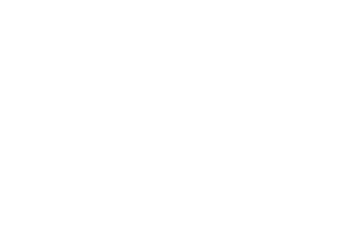

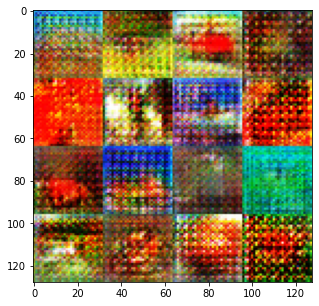

In [0]:
show_image_grid(generator.predict(K.random_normal(shape=[16, codings_size]).numpy()))    
generator_model.save("/drive/My Drive/generator_model-002.h5")
critic_model.save("/drive/My Drive/generator_model-002.h5")
generator.save("/drive/My Drive/generator_model-002.h5")